Start by creating a new `conda` environment:

```bash
$ conda create -n pyannote python=3.6 anaconda
$ source activate pyannote
```

Then, install `pyannote-video` and its dependencies:

```bash
$ pip install pyannote-video
```

Finally, download sample video and `dlib` models:

```bash
$ git clone https://github.com/pyannote/pyannote-data.git
$ git clone https://github.com/davisking/dlib-models.git
$ bunzip2 dlib-models/dlib_face_recognition_resnet_model_v1.dat.bz2
$ bunzip2 dlib-models/shape_predictor_68_face_landmarks.dat.bz2
```

To execute this notebook locally:
```bash
$ jupyter notebook video_to_face_repr.ipynb
```


In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
from os import path
episode_name = "friends"
suffix = "mp4"
episode_file = f"{episode_name}.{suffix}"

parent_directory = "."
data_directory = path.join("data_friends")
output_directory = path.join(data_directory, "output")

In [3]:
shots_path = f"{data_directory}/{episode_name}.shots.json"

In [4]:
tracks_path = f"{data_directory}/{episode_name}.track.txt"

In [5]:
embedding_path = f"{data_directory}/{episode_name}.embedding.txt"
landmarks_path = f"{data_directory}/{episode_name}.landmarks.txt"

In [6]:
labels_path = f"{data_directory}/{episode_name}.labels.txt"
max_tracks_in_file = 500
clusters_path = f"{data_directory}/clustering_results.{episode_name}.pickle.{max_tracks_in_file}"

In [7]:
tracks_object_path = f"{data_directory}/tracks.{episode_name}.data"
tracks_frames_object_path = f"{data_directory}/tracks_frames.{episode_name}.data"

Without negative by distance

# Shot segmentation

In [3]:
!python -V

Python 3.6.10 :: Anaconda, Inc.


In [4]:
%run pyannote-structure.py --help

Video structure

The standard pipeline for is the following:

    shot boundary detection ==> shot threading ==> segmentation into scenes

Usage:
  pyannote-structure.py shot [options] <video> <output.json>
  pyannote-structure.py thread [options] <video> <shot.json> <output.json>
  pyannote-structure.py scene [options] <video> <thread.json> <output.json>
  pyannote-structure.py (-h | --help)
  pyannote-structure.py --version

Options:
  --ffmpeg=<ffmpeg>      Specify which `ffmpeg` to use.
  --height=<n_pixels>    Resize video frame to height <n_pixels> [default: 50].
  --window=<n_seconds>   Apply median filtering on <n_seconds> window [default: 2.0].
  --threshold=<value>    Set threshold to <value> [default: 1.0].
  --min-match=<n_match>  Set minimum number of matches to <n_match> [default: 20].
  --lookahead=<n_shots>  Look at up to <n_shots> following shots [default: 24].
  -h --help              Show this screen.
  --version              Show version.
  --verbose              Sh

In [6]:
%run pyannote-structure.py shot --verbose {data_directory}/{episode_file} \
                                      {shots_path}

100%|█████████████████████████████████████████████████████████████████████████| 4.17k/4.17k [04:38<00:00, 15.0frames/s]


Detected shot boundaries can be visualized using `pyannote.core` notebook support:

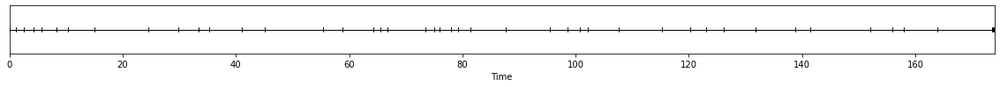

In [7]:
from pyannote.core.json import load_from
shots = load_from(shots_path)
shots

# Face processing

In [8]:
%run pyannote-face.py --help

Face detection and tracking

The standard pipeline is the following

      face tracking => feature extraction => face clustering

Usage:
  pyannote-face track [options] <video> <shot.json> <tracking>
  pyannote-face extract [options] <video> <tracking> <landmark_model> <embedding_model> <landmarks> <embeddings>
  pyannote-face demo [options] <video> <tracking> <output>
  pyannote-face (-h | --help)
  pyannote-face --version

General options:

  --ffmpeg=<ffmpeg>         Specify which `ffmpeg` to use.
  -h --help                 Show this screen.
  --version                 Show version.
  --verbose                 Show processing progress.

Face tracking options (track):

  <video>                   Path to video file.
  <shot.json>               Path to shot segmentation result file.
  <tracking>                Path to tracking result file.

  --min-size=<ratio>        Approximate size (in video height ratio) of the
                            smallest face that should be detected. D

<Figure size 432x288 with 0 Axes>

### Face tracking

In [10]:
%run pyannote-face.py track --verbose --every=0.1 {data_directory}/{episode_file} \
                                              {shots_path} \
                                              {tracks_path}

100%|███████████████████████████████████████████████████████████████████████| 4.17k/4.17k [1:57:47<00:00, 1.69s/frames]


Face tracks can be visualized using `demo` mode:

In [11]:
%run pyannote-face.py demo {data_directory}/{episode_file}\
    {tracks_path} \
    {data_directory}/{episode_name}.track.mp4 --from 10 --until 40

[MoviePy] >>>> Building video data_friends/friends.track.mp4
[MoviePy] Writing audio in friends.trackTEMP_MPY_wvf_snd.mp3


100%|█████████████████████████████████████████████████████████████████████████████| 3837/3837 [00:05<00:00, 747.23it/s]

[MoviePy] Done.
[MoviePy] Writing video data_friends/friends.track.mp4



100%|██████████████████████████████████████████████████████████████████████████████| 4172/4172 [01:26<00:00, 48.46it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: data_friends/friends.track.mp4 



In [12]:
import io
import base64
from IPython.display import HTML
video = io.open('{0}/{1}.track.mp4'.format(data_directory, episode_name), 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls><source src="data:video/mp4;base64,{0}" type="video/mp4" /></video>'''.format(encoded.decode('ascii')))

### Facial landmarks and face embedding

In [3]:
%run pyannote-face.py extract -h

Face detection and tracking

The standard pipeline is the following

      face tracking => feature extraction => face clustering

Usage:
  pyannote-face track [options] <video> <shot.json> <tracking>
  pyannote-face extract [options] <video> <tracking> <landmark_model> <embedding_model> <landmarks> <embeddings>
  pyannote-face demo [options] <video> <tracking> <output>
  pyannote-face (-h | --help)
  pyannote-face --version

General options:

  --ffmpeg=<ffmpeg>         Specify which `ffmpeg` to use.
  -h --help                 Show this screen.
  --version                 Show version.
  --verbose                 Show processing progress.

Face tracking options (track):

  <video>                   Path to video file.
  <shot.json>               Path to shot segmentation result file.
  <tracking>                Path to tracking result file.

  --min-size=<ratio>        Approximate size (in video height ratio) of the
                            smallest face that should be detected. D

In [7]:
%run pyannote-face.py extract --verbose {data_directory}/{episode_file} {tracks_path} \
                                    ../dlib-models/shape_predictor_68_face_landmarks.dat \
                                    ../dlib-models/dlib_face_recognition_resnet_model_v1.dat \
                                    {landmarks_path} \
                                    {embedding_path}

100%|█████████████████████████████████████████████████████████████████████████| 4.17k/4.17k [40:45<00:00, 1.71frames/s]


### Face clustering

Once embeddings are extracted, let's apply face track hierarchical agglomerative clustering.  
The distance between two clusters is defined as the average euclidean distance between all embeddings.  
NOTICE: when asked for labels enter name without a space.

In [3]:
%run cluster_and_label -h

usage: cluster_and_label.py [-h] [--clusters_path [clusters_path]]
                            [--load_cached] [--episode [episode]]
                            [--suffix [suffix]] [--data_dir [data_dir]]
                            [--frames_dir [frames]]
                            [--embedding_path [embedding_path]]
                            [--tracks_path [tracks]] [--labels_path [labels]]
                            [--max [max_tracks]]

optional arguments:
  -h, --help            show this help message and exit
  --clusters_path [clusters_path]
                        the path of the clustering results
  --load_cached         load existing clustering results, useful for
                        relabeling
  --episode [episode]   the name of the episode
  --suffix [suffix]     the name of the episode
  --data_dir [data_dir]
                        the path of the datat directory
  --frames_dir [frames]
                        the path of the datat directory
  --embedding_path [em

Next merging candidates are 81 78 with (similarity = -0.303064).
Next merging candidates are 67 81 with (similarity = -0.331237).
Next merging candidates are 64 67 with (similarity = -0.338856).
Next merging candidates are 33 32 with (similarity = -0.339187).
Next merging candidates are 6 4 with (similarity = -0.339348).
Next merging candidates are 44 36 with (similarity = -0.353463).
Next merging candidates are 46 43 with (similarity = -0.391737).
Next merging candidates are 49 25 with (similarity = -0.402097).
Next merging candidates are 5 3 with (similarity = -0.413508).
Next merging candidates are 76 71 with (similarity = -0.416201).
Next merging candidates are 14 11 with (similarity = -0.419819).
Next merging candidates are 44 5 with (similarity = -0.432775).
Next merging candidates are 2 14 with (similarity = -0.436563).
Next merging candidates are 62 76 with (similarity = -0.438144).
Next merging candidates are 82 77 with (similarity = -0.439402).
Next merging candidates are 35 

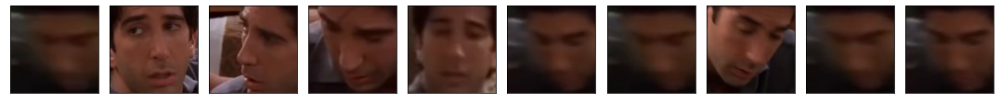

Enter identity name: Ross


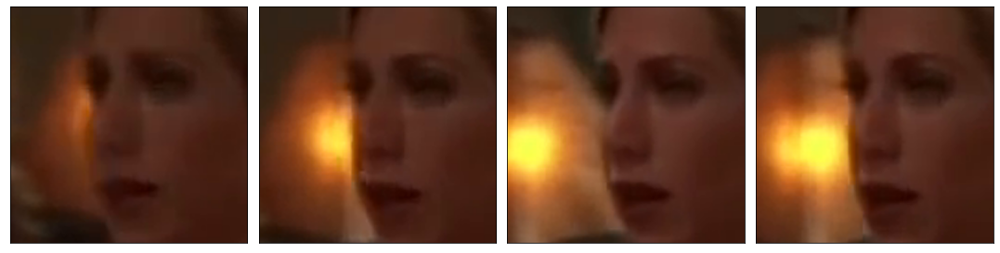

Enter identity name: Rachel


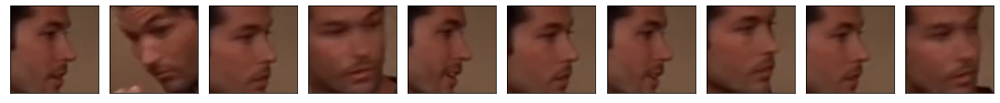

Enter identity name: p1


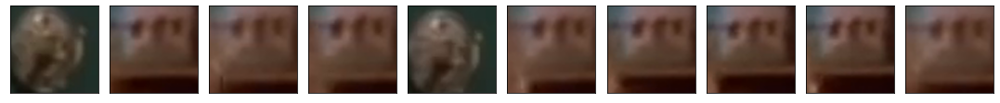

Enter identity name: false_alarm


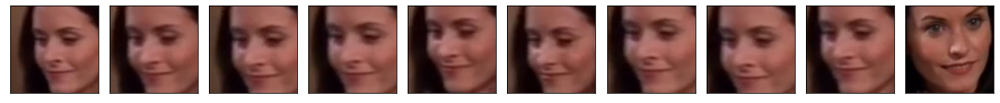

Enter identity name: Monica


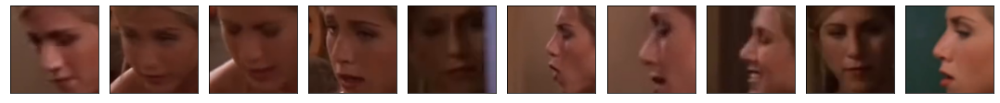

Enter identity name: Rachel


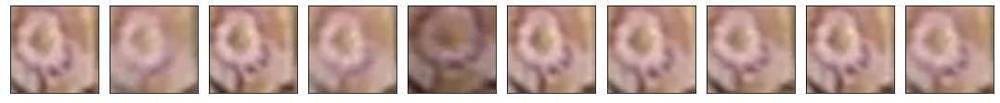

Enter identity name: false_alarm


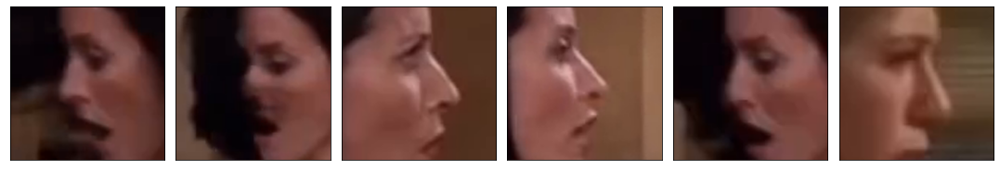

Enter identity name: Monica


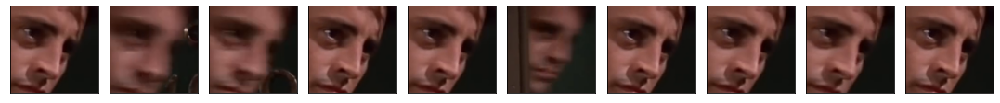

Enter identity name: Joey


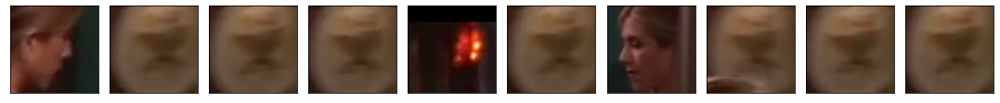

Enter identity name: false_alarm
writing labels to data_friends/friends.labels.txt


In [9]:
%run cluster_and_label --data_dir {data_directory} --tracks_path {tracks_path} \
    --labels_path {labels_path} --embedding_path {embedding_path} \
    --episode {episode_name} --suffix {suffix} \
    --max {max_tracks_in_file} --clusters_path {clusters_path}

If you have already clustering results and you just want to relabel, run with --clusters_path {clusters_path} --load_cached

In [ ]:
%run cluster_and_label  --episode {episode_name} --suffix {suffix} \
     --max {max_tracks_in_file} --clusters_path {clusters_path} --load_cached

#### Alternatively, we can use directly the clustering of pyannote.

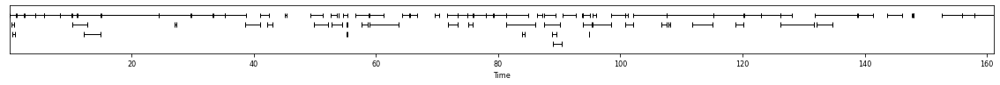

In [10]:
from pyannote.video.face.clustering import FaceClustering
clustering = FaceClustering(threshold=0.6)
face_tracks, embeddings = clustering.model.preprocess(embedding_path)
face_tracks.get_timeline()

Next merging candidates are 81 78 with (similarity = -0.303064).
Next merging candidates are 67 81 with (similarity = -0.331237).
Next merging candidates are 64 67 with (similarity = -0.338856).
Next merging candidates are 33 32 with (similarity = -0.339187).
Next merging candidates are 6 4 with (similarity = -0.339348).
Next merging candidates are 44 36 with (similarity = -0.353463).
Next merging candidates are 46 43 with (similarity = -0.391737).
Next merging candidates are 49 25 with (similarity = -0.402097).
Next merging candidates are 5 3 with (similarity = -0.413508).
Next merging candidates are 76 71 with (similarity = -0.416201).
Next merging candidates are 14 11 with (similarity = -0.419819).
Next merging candidates are 44 5 with (similarity = -0.432775).
Next merging candidates are 2 14 with (similarity = -0.436563).
Next merging candidates are 62 76 with (similarity = -0.438144).
Next merging candidates are 82 77 with (similarity = -0.439402).
Next merging candidates are 35 

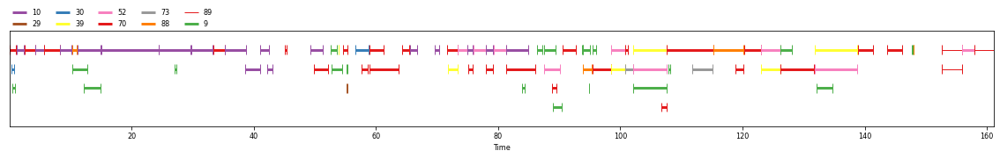

In [11]:
result = clustering(face_tracks, features=embeddings)
import pickle
with open(f'{data_directory}/clustering_result.{episode_name}.pickle', 'wb') as f:
    pickle.dump(result, f)

result

In [ ]:
from pyannote.core import notebook, Segment
notebook.reset()
notebook.crop = Segment(0, 30)
mapping = {8: 'Leonard', 5: 'Sheldon', 9: 'Receptionist', 7: 'False_alarm'}
result = result.rename_labels(mapping=mapping)
result

In [ ]:
with open(labels_path, 'w') as fp:
    for _, track_id, cluster in result.itertracks(yield_label=True):
        fp.write(f'{track_id} {cluster}\n')

In [12]:
%run pyannote-face.py demo {data_directory}/{episode_file} \
                       {tracks_path} \
                       --label={labels_path} \
                       {data_directory}/{episode_name}.final.mp4

[MoviePy] >>>> Building video data_friends/friends.final.mp4
[MoviePy] Writing audio in friends.finalTEMP_MPY_wvf_snd.mp3


100%|█████████████████████████████████████████████████████████████████████████████| 3837/3837 [00:04<00:00, 845.63it/s]

[MoviePy] Done.


[MoviePy] Writing video data_friends/friends.final.mp4


100%|██████████████████████████████████████████████████████████████████████████████| 4172/4172 [01:36<00:00, 43.07it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: data_friends/friends.final.mp4 



<Figure size 432x288 with 0 Axes>

In [ ]:
import io
import base64
from IPython.display import HTML
video = io.open(f'{data_directory}/{episode_name}.final.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls><source src="data:video/mp4;base64,{0}" type="video/mp4" /></video>'''.format(encoded.decode('ascii')))

### Extraing tracks frames and features

In [5]:
%run track_extraction.py -h

usage: track_extraction.py [-h] [--visualize]
                           [--tracks_output [tracks_output]]
                           [--labels [labels]]
                           video_path [video_path ...] tracks_path
                           [tracks_path ...] output_path [output_path ...]

positional arguments:
  video_path            the path of the video
  tracks_path           the path of the tracks
  output_path           the output directory

optional arguments:
  -h, --help            show this help message and exit
  --visualize
  --tracks_output [tracks_output]
                        the path of the tracks
  --labels [labels]     the path of the labels file


2021-06-02 12:30:11.905871: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'cudart64_110.dll'; dlerror: cudart64_110.dll not found
2021-06-02 12:30:11.905896: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [8]:
%run track_extraction.py --video {data_directory}/{episode_file} \
                         --tracks {tracks_path} --tracks_file {tracks_object_path} \
                         --data_dir {data_directory} --track_frames_path  {tracks_frames_object_path} \
                         --labels {labels_path} 

track extraction input:
	video: data_friends/friends.mp4
	tracks: data_friends/friends.track.txt
	labels: data_friends/friends.labels.txt
track extraction writing output to:
	 data_friends/tracks.friends.data
track unique labels:  {'Monica', 'p1', 'Ross', 'false_alarm', 'Joey', 'Rachel'}
track 0: 0.042 start extracting frames
track 1: 0.334 start extracting frames
track 2: 0.500 start extracting frames
track 3: 1.210 start extracting frames
track 4: 2.502 start extracting frames
track 5: 4.296 start extracting frames
track 6: 5.714 start extracting frames
track 7: 8.300 start extracting frames
track 8: 10.260 start extracting frames
track 9: 10.260 start extracting frames
track 10: 11.136 start extracting frames
track 11: 12.262 start extracting frames
track 12: 15.057 start extracting frames
track 13: 24.524 start extracting frames
track 14: 27.110 start extracting frames
track 15: 29.780 start extracting frames
track 16: 33.450 start extracting frames
track 17: 35.327 start extractin

track 36: 65.607 start extracting frames
track 37: 69.611 start extracting frames
track 38: 71.655 start extracting frames
track 39: 71.738 start extracting frames
track 40: 73.448 start extracting frames
track 41: 75.033 start extracting frames
track 42: 75.075 start extracting frames
skip overlapping tracks: ['41']
track 43: 75.951 start extracting frames
track 44: 78.036 start extracting frames
track 45: 78.036 start extracting frames
track 46: 79.246 start extracting frames
track 47: 81.373 start extracting frames
track 48: 81.373 start extracting frames
track 49: 83.917 start extracting frames
track 50: 86.420 start extracting frames
track 51: 87.588 start extracting frames
track 52: 87.588 start extracting frames
track 53: 88.839 start extracting frames
track 54: 88.922 start extracting frames
track 55: 88.964 start extracting frames
skip overlapping tracks: ['53']
track 53: 89.006 start extracting frames
skip overlapping tracks: ['53']
track 53: 89.047 start extracting frames
sk

track 89: 155.280 start extracting frames
skip overlapping tracks: ['89']
track 89: 155.322 start extracting frames
skip overlapping tracks: ['89']
track 89: 155.364 start extracting frames
skip overlapping tracks: ['89']
track 89: 155.405 start extracting frames
skip overlapping tracks: ['89']
track 89: 155.447 start extracting frames
skip overlapping tracks: ['89']
track 89: 155.489 start extracting frames
skip overlapping tracks: ['89']
track 89: 155.530 start extracting frames
skip overlapping tracks: ['89']
track 89: 155.572 start extracting frames
skip overlapping tracks: ['89']
track 89: 155.614 start extracting frames
skip overlapping tracks: ['89']
track 89: 155.655 start extracting frames
skip overlapping tracks: ['89']
track 89: 155.697 start extracting frames
skip overlapping tracks: ['89']
track 89: 155.739 start extracting frames
skip overlapping tracks: ['89']
track 89: 155.781 start extracting frames
skip overlapping tracks: ['89']
track 89: 155.822 start extracting fra

In [13]:
%run track_extraction.py --video {data_directory}/{episode_file} \
                         --tracks {tracks_path} --tracks_file {tracks_object_path} \
                         --data_dir {data_directory} --track_frames_path  {tracks_frames_object_path} \
                         --labels {labels_path} --features_only

track extraction input:
	video: data_friends/friends.mp4
	tracks: data_friends/friends.track.txt
	labels: data_friends/friends.labels.txt
track extraction writing output to:
	 data_friends/tracks.friends.data
track unique labels:  {'false_alarm', 'Joey', 'p1', 'Rachel', 'Ross', 'Monica'}
following track ids: ['34', '54', '86'] are not labeled in the labels file
skipping unlabeled or false_alarm tracks:  ['2', '9', '11', '14', '24', '25', '26', '28', '34', '39', '49', '50', '51', '54', '55', '57', '59', '60', '61', '64', '66', '67', '69', '72', '73', '78', '79', '81', '83', '86', '87']
track 0: 0.042 start extracting features
skipping track 1 with label p1, only 2 tracks
track 3: 1.210 start extracting features
track 4: 2.502 start extracting features
track 5: 4.296 start extracting features
track 6: 5.714 start extracting features
track 7: 8.300 start extracting features
track 8: 10.260 start extracting features
track 10: 11.136 start extracting features
track 12: 15.057 start extracti

In [10]:
tracks_frames_object_path

'data_friends/tracks_frames.friends.data'

In [9]:
%run track_extraction.py --video {data_directory}/{episode_file} \
                         --tracks {tracks_path} --tracks_file {tracks_object_path} \
                         --data_dir {data_directory} --track_frames_path  {tracks_frames_object_path} \
                         --labels {labels_path} 

track extraction input:
	video: data_friends/friends.mp4
	tracks: data_friends/friends.track.txt
	labels: data_friends/friends.labels.txt
track extraction writing output to:
	 data_friends/friends.tracks.data
track unique labels:  {'Ross', 'Rachel', 'monica', 'joey', 'false_alarm', 'p1'}
missing tids in labels file: ['86', '34', '54']
skipping track ids:  ['86', '78', '66', '34', '87', '79', '14', '72', '55', '83', '50', '64', '26', '61', '67', '81', '59', '39', '51', '2', '24', '49', '9', '54', '73', '25', '57', '28', '69', '11', '60']
track 0: 0.042 start extracting frames
track 1: 0.334 start extracting frames
track 3: 1.210 start extracting frames
track 4: 2.502 start extracting frames
track 5: 4.296 start extracting frames
track 6: 5.714 start extracting frames
track 7: 8.300 start extracting frames
track 8: 10.260 start extracting frames
track 10: 11.136 start extracting frames
track 12: 15.057 start extracting frames
track 13: 24.524 start extracting frames
track 15: 29.780 star

#### Visualize labeling to make sure the dataset you are going to work with is valid.
visualize_clusters create excel with clusters and image of each tracks, to examine the process of tracks extraction and clustering.
organize_frames_by_identity creates directories by identity and stores all of the identity frames in the directory.
You can choose one of these methods for validating your data.

In [ ]:
%run visualize_clusters.py --episode {episode_name}

In [4]:
%run organize_frames_by_identity -h

usage: organize_frames_by_identity.py [-h] [--frames_dir [frames]]
                                      [--output_dir [output]]
                                      [--labels_path [labels]]

optional arguments:
  -h, --help            show this help message and exit
  --frames_dir [frames]
                        the pate of the frames directory
  --output_dir [output]
                        the pate of the output directory
  --labels_path [labels]
                        the pate of the embedding file


In [16]:
%run organize_frames_by_identity  --labels {labels_path} \
    --frames_dir {data_directory}/frames \
    --output_dir {data_directory}/frames

### Training and evaluation

In [1]:
%run train.py -h

usage: train.py [-h] [--tracks [tracks]] [--shots [shots]] [--epochs [epochs]]
                [--negative [negative_pairs]] [--batch [batch]]
                [--learning_rate [learning_rate]] [--network_type [network]]
                [--checkpoint_path [checkpoint_path]] [--output [output]]
                [--negative_by_distance] [--repr_layer [repr_layer]]

optional arguments:
  -h, --help            show this help message and exit
  --tracks [tracks]     the path of the tracks file
  --shots [shots]       the path of the tracks file
  --epochs [epochs]     number of epochs to learn from
  --negative [negative_pairs]
                        number of negative pairs to use. on small dataset
                        consider using smaller number.
  --batch [batch]       size of batches to learn from
  --learning_rate [learning_rate]
                        learning rate of sgd, if none learning with other
                        optimizer
  --network_type [network]
  --checkpoint_path

loading tracks from: data_friends/tracks.friends.data
done creating dataset
	Size: 16068
	Errors: 806
	Characters: {'Rachel': 21, 'Ross': 15, 'Monica': 8}
done creating dataset
	Size: 2154
	Errors: 30
	Characters: {'Ross': 2, 'Rachel': 4, 'Monica': 3}
done creating dataset
	Size: 1290
	Errors: 68
	Characters: {'Monica': 1, 'Rachel': 2}
done creating datasets
save vis to:  data_friends/output\visualize_dataset_train_08122021_192823.png


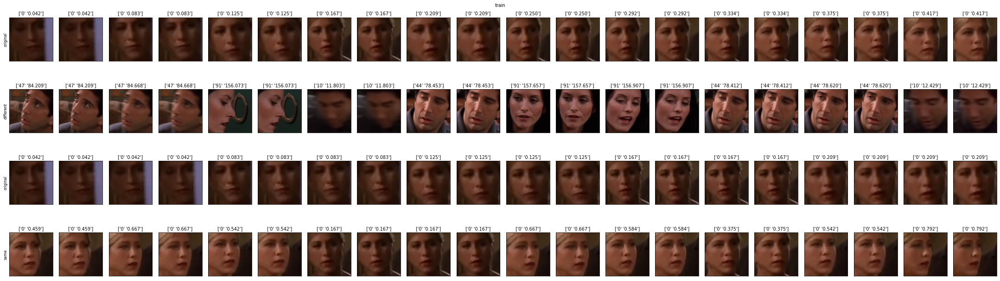

save vis to:  data_friends/output\visualize_dataset_validation_08122021_192828.png
save vis to:  data_friends/output\visualize_dataset_test_08122021_192831.png
training with 16068 pairs, validating with 2154
learning:  rms
Model: "model_12"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_14 (InputLayer)           [(None, 2048)]       0                                            
__________________________________________________________________________________________________
input_15 (InputLayer)           [(None, 2048)]       0                                            
__________________________________________________________________________________________________
model_11 (Functional)           (None, 256)          1249280     input_14[0][0]                   
                                                                 i

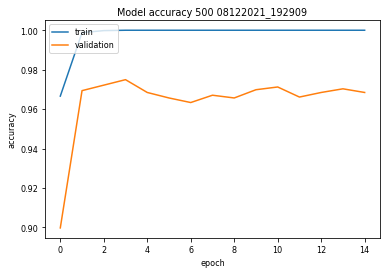

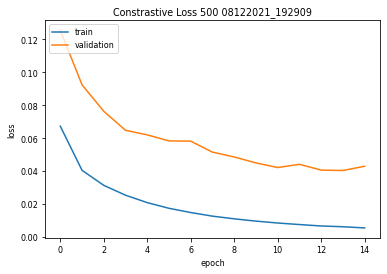

68/68 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.9684
[0.04295148327946663, 0.9684308171272278]
Model: "model_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 2048)]            0         
_________________________________________________________________
dense_16 (Dense)             (None, 512)               1049088   
_________________________________________________________________
batch_normalization_12 (Batc (None, 512)               2048      
_________________________________________________________________
dense_17 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_13 (Batc (None, 256)               1024      
_________________________________________________________________
dense_18 (Dense)             (None, 256)               65792 

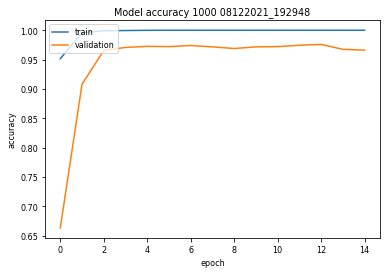

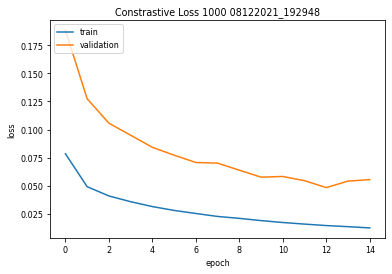

68/68 [==============================] - 0s 4ms/step - loss: 0.0556 - accuracy: 0.9661
[0.05560329928994179, 0.966109573841095]
Model: "model_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        [(None, 2048)]            0         
_________________________________________________________________
dense_20 (Dense)             (None, 512)               1049088   
_________________________________________________________________
batch_normalization_15 (Batc (None, 512)               2048      
_________________________________________________________________
dense_21 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_16 (Batc (None, 256)               1024      
_________________________________________________________________
dense_22 (Dense)             (None, 256)               65792  

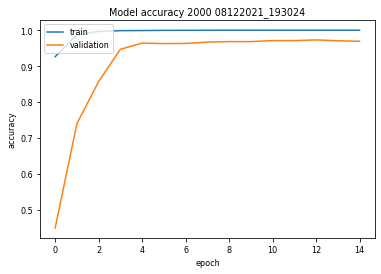

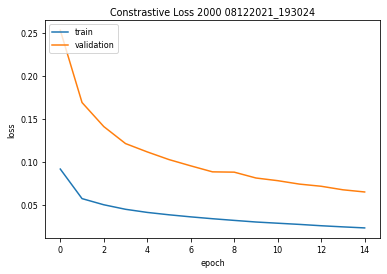

68/68 [==============================] - 0s 4ms/step - loss: 0.0647 - accuracy: 0.9694
[0.0647316724061966, 0.9693593382835388]
Model: "model_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        [(None, 2048)]            0         
_________________________________________________________________
dense_24 (Dense)             (None, 512)               1049088   
_________________________________________________________________
batch_normalization_18 (Batc (None, 512)               2048      
_________________________________________________________________
dense_25 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_19 (Batc (None, 256)               1024      
_________________________________________________________________
dense_26 (Dense)             (None, 256)               65792  

In [10]:
%run train.py --output {data_directory}/output \
    --tracks {tracks_object_path} --shots {shots_path} \
    --epochs 15 --negative 2 --negative_by_distance --network_type "deep" \
    --checkpoint_path "{data_directory}/checkpoint/neg_{{}}_{{}}_{{}}_{{}}\cp.ckpt"